In [1]:
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
CS = "cs"
MATH = "math"
STAT = "stat"
SUBJECT = CS

In [ ]:
# data = pd.read_csv(f"dataset/arxiv_{SUBJECT}_emb.csv")
# data

,title,submitted_date,tag_text,text
0,Fault Detection using Immune-Based Systems and...,2000-10-03,"Computational Engineering, Finance, and Scienc...",fault detection using immunebased systems and ...
1,Robust Classification for Imprecise Environments,2000-09-13,Machine Learning,robust classification for imprecise environmen...
2,Tagger Evaluation Given Hierarchical Tag Sets,2000-08-09,Computation and Language,tagger evaluation given hierarchical tag sets....
3,Description of GADEL,2000-03-07,"Artificial Intelligence, Logic in Computer Sci...",description of gadel. this article describes t...
4,The dynamics of iterated transportation simula...,2000-02-22,"Adaptation and Self-Organizing Systems, Comput...",the dynamics of iterated transportation simula...
...,...,...,...,...
159242,Mining the Long Tail: A Comparative Study of D...,2025-09-16,"Robotics, Artificial Intelligence, Machine Lea...",mining the long tail a comparative study of da...
159243,Adaptive Data-Knowledge Alignment in Genetic P...,2025-10-01,"Molecular Networks, Artificial Intelligence, M...",adaptive dataknowledge alignment in genetic pe...
159244,Sobolev Training of End-to-End Optimization Pr...,2025-05-16,"Machine Learning, Optimization and Control",sobolev training of endtoend optimization prox...
159245,Beyond Unimodal Boundaries: Generative Recomme...,2025-03-30,"Information Retrieval, Artificial Intelligence...",beyond unimodal boundaries generative recommen...


### data count

In [3]:
data_cs = pd.read_csv("dataset/arxiv_cs_emb_v3.csv")
data_math = pd.read_csv("dataset/arxiv_math_emb_v3.csv")
data_stat = pd.read_csv("dataset/arxiv_stat_emb_v3.csv")


In [11]:
len(data_cs), len(data_math), len(data_stat)

(770732, 615339, 119625)

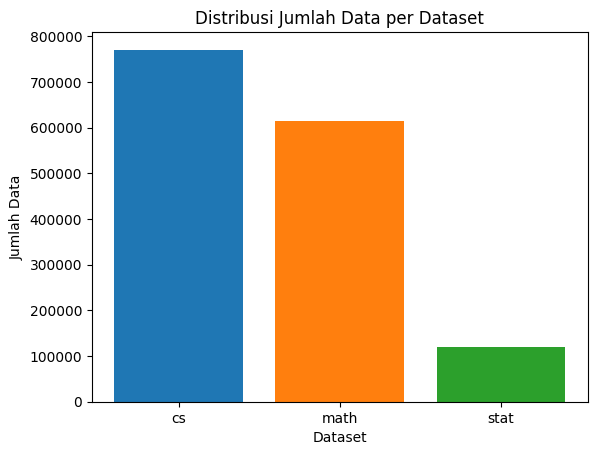

In [4]:
len_data = [len(data_cs), len(data_math), len(data_stat)]
data_name = ['cs', 'math', 'stat']

plt.bar(data_name, len_data, color=['tab:blue', 'tab:orange', 'tab:green'])
plt.title("Distribusi Jumlah Data per Dataset")
plt.ylabel("Jumlah Data")
plt.xlabel("Dataset")
plt.show()


In [5]:
data = pd.concat([data_cs, data_math, data_stat])

In [6]:
data

,title,submitted_date,text,tag_text
0,Von Neumann Quantum Logic vs. Classical von Ne...,2000-01-03,von neumann quantum logic vs classical von neu...,"Other Computer Science, Quantum Physics"
1,Minimum Description Length and Compositionality,2000-01-04,minimum description length and compositionalit...,"Computation and Language, Artificial Intelligence"
2,Why C++ is not very fit for GUI programming,2000-01-06,why c is not very fit for gui programming with...,Programming Languages
3,Effect of different packet sizes on RED perfor...,2000-01-07,effect of different packet sizes on red perfor...,Networking and Internet Architecture
4,Multiplicative Algorithm for Orthgonal Groups ...,2000-01-07,multiplicative algorithm for orthgonal groups ...,Machine Learning
...,...,...,...,...
119620,Quantifying Individual Risk for Binary Outcome,2025-10-02,quantifying individual risk for binary outcome...,Methodology
119621,Neural Network Parameter-optimization of Gauss...,2025-10-02,neural network parameter optimization of gauss...,"Machine Learning, Artificial Intelligence, Mac..."
119622,Convergence analysis of online algorithms for ...,2025-10-02,convergence analysis of online algorithms for ...,"Machine Learning, Numerical Analysis"
119623,Wasserstein multivariate auto-regressive model...,2025-10-02,wasserstein multivariate auto regressive model...,"Machine Learning, Machine Learning"


### Barchart Journal Per Year

In [7]:
data['submitted_date'] = pd.to_datetime(data['submitted_date'])
data['year'] = data['submitted_date'].dt.year
yearly_counts = data['year'].value_counts().sort_index()
table = yearly_counts.reset_index()
table.columns = ['Tahun', 'Jumlah Artikel']
print(table)


    Tahun  Jumlah Artikel
0    2000            3706
1    2001            3973
2    2002            5029
3    2003            6170
4    2004            7396
5    2005            8965
6    2006           11097
7    2007           14241
8    2008           16255
9    2009           18927
10   2010           23502
11   2011           27873
12   2012           34608
13   2013           39977
14   2014           43676
15   2015           48936
16   2016           56341
17   2017           65592
18   2018           81055
19   2019           98248
20   2020          117802
21   2021          122394
22   2022          125442
23   2023          142816
24   2024          183120
25   2025          198555


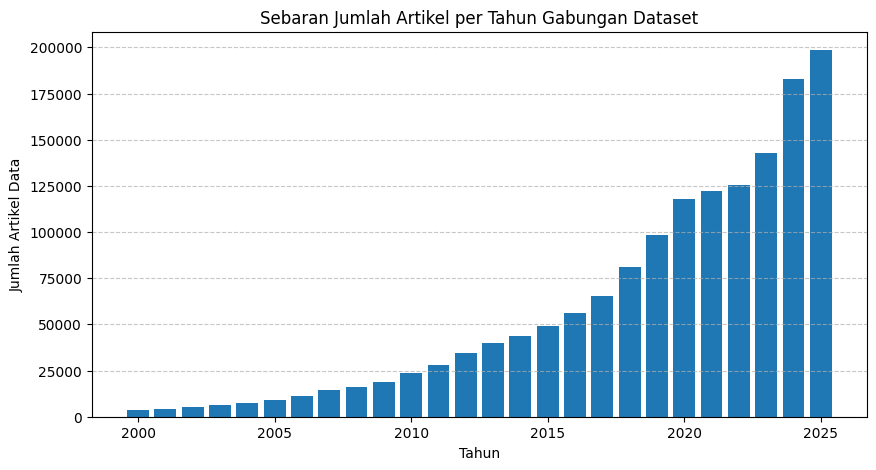

In [8]:
data['submitted_date'] = pd.to_datetime(data['submitted_date'])
data['year'] = data['submitted_date'].dt.year
yearly_counts = data['year'].value_counts().sort_index()
plt.figure(figsize=(10,5))
plt.bar(yearly_counts.index, yearly_counts.values)
plt.title('Sebaran Jumlah Artikel per Tahun Gabungan Dataset')
plt.xlabel('Tahun')
plt.ylabel('Jumlah Artikel Data')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


### Word Count Frequency

In [9]:
import ast
word_counts_per_row = data["text"].str.split().str.len()

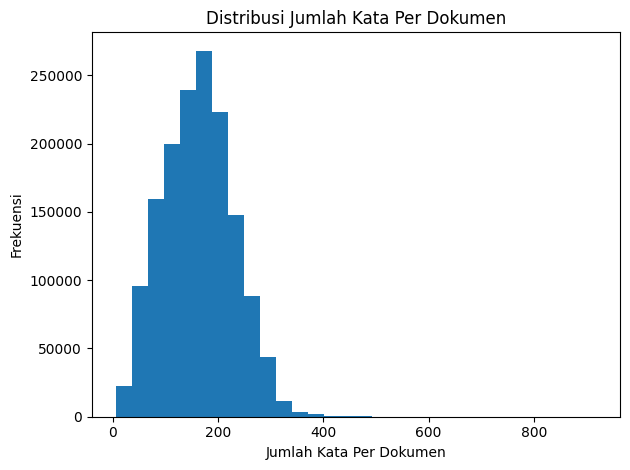

In [10]:
from collections import Counter
freq = Counter(word_counts_per_row)

x = sorted(freq.keys())          
y = [freq[k] for k in x]        

plt.figure()
plt.hist(word_counts_per_row, bins=30)
plt.xlabel("Jumlah Kata Per Dokumen")
plt.ylabel("Frekuensi")
plt.title("Distribusi Jumlah Kata Per Dokumen")
plt.tight_layout()
plt.show()


### Jumlah artikel per Tag

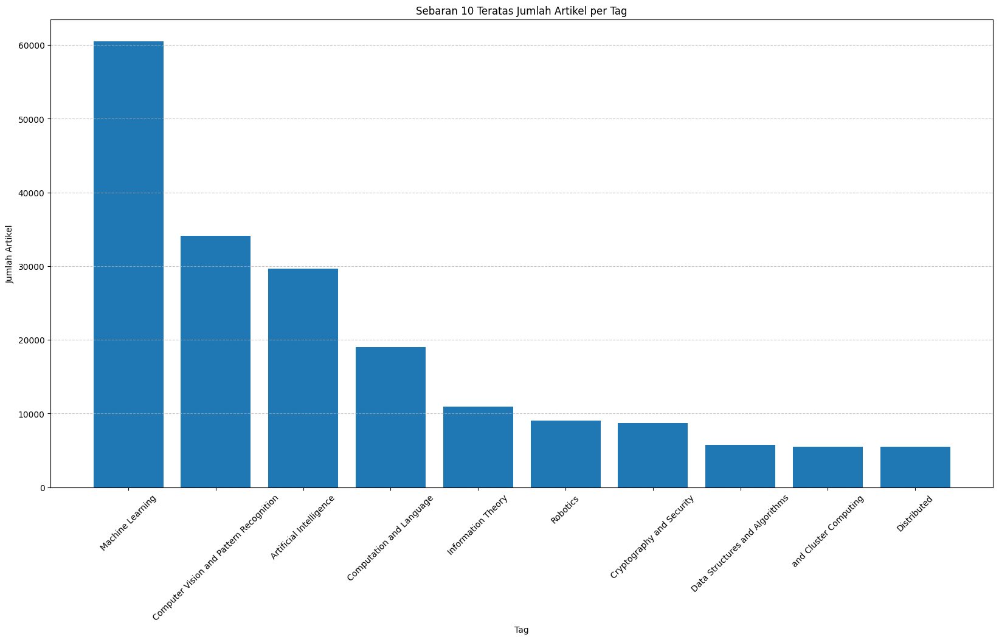

In [6]:
import pandas as pd

data['tag_text'] = data['tag_text'].fillna('')
tags_series = data['tag_text'].str.split(',')
exploded = data.assign(tag=tags_series).explode('tag')
exploded['tag'] = exploded['tag'].str.strip()
tag_counts = exploded['tag'].value_counts().reset_index()
tag_counts.columns = ['Tag', 'Jumlah Artikel']
plt.figure(figsize=(20,10))
plt.bar(tag_counts['Tag'].head(10), tag_counts['Jumlah Artikel'].head(10))
plt.title('Sebaran 10 Teratas Jumlah Artikel per Tag')
plt.xlabel('Tag')
plt.ylabel('Jumlah Artikel')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

### Word View Per Year

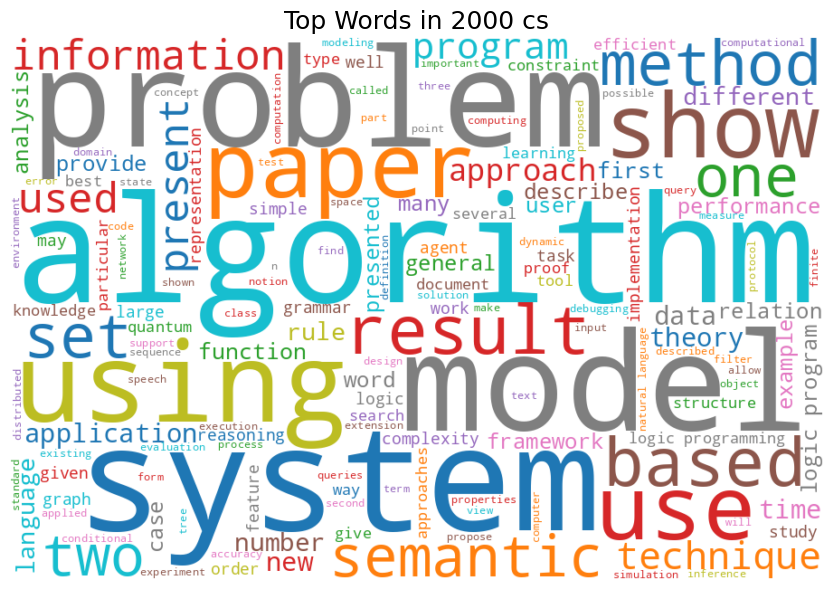

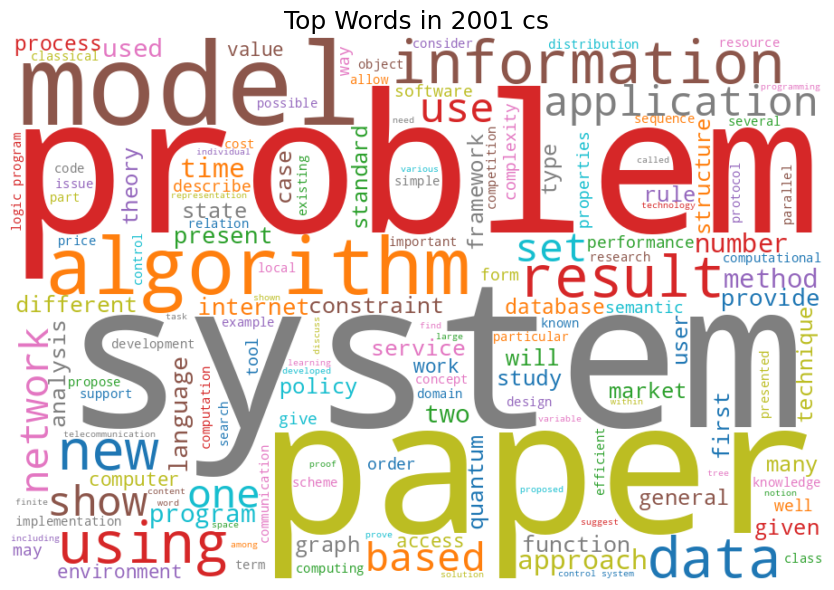

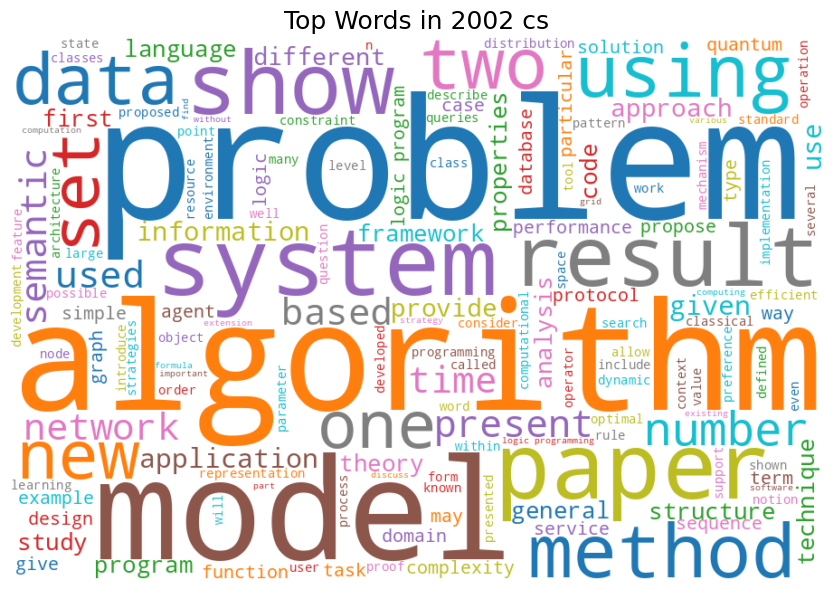

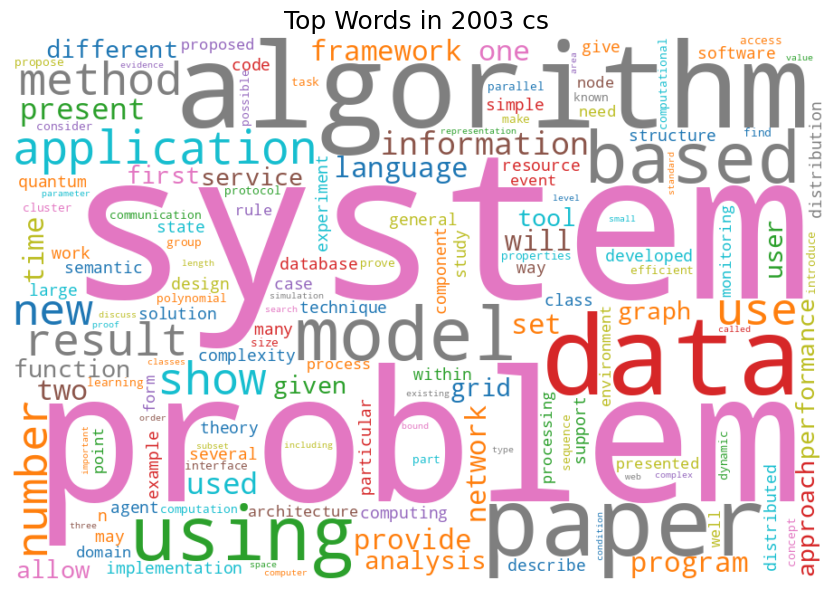

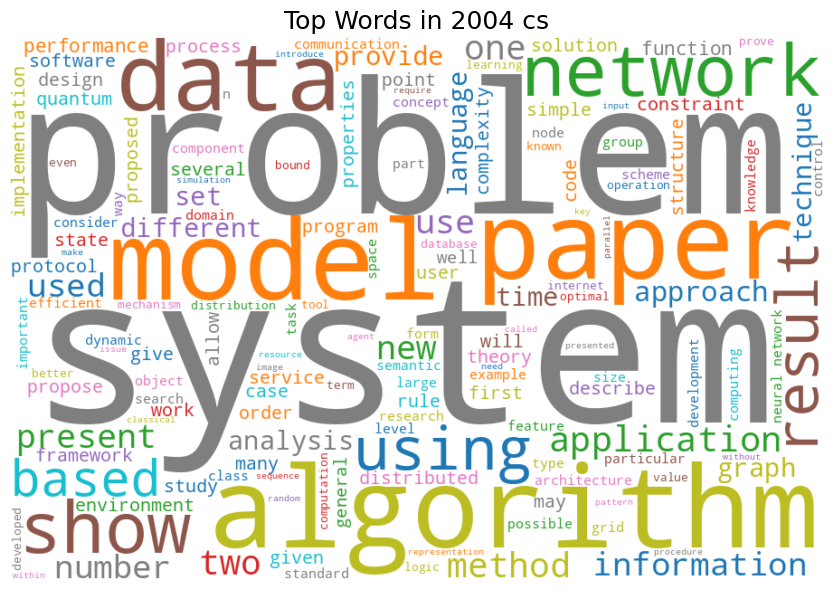

...

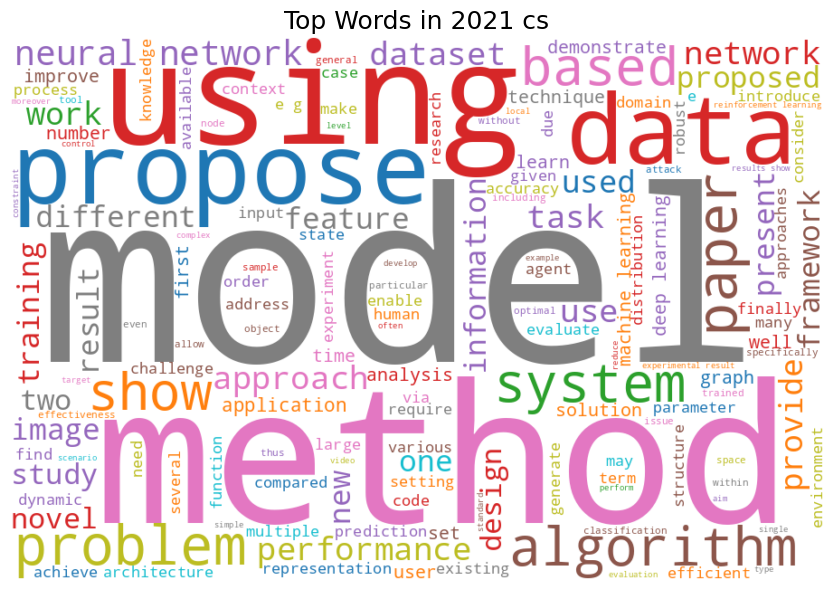

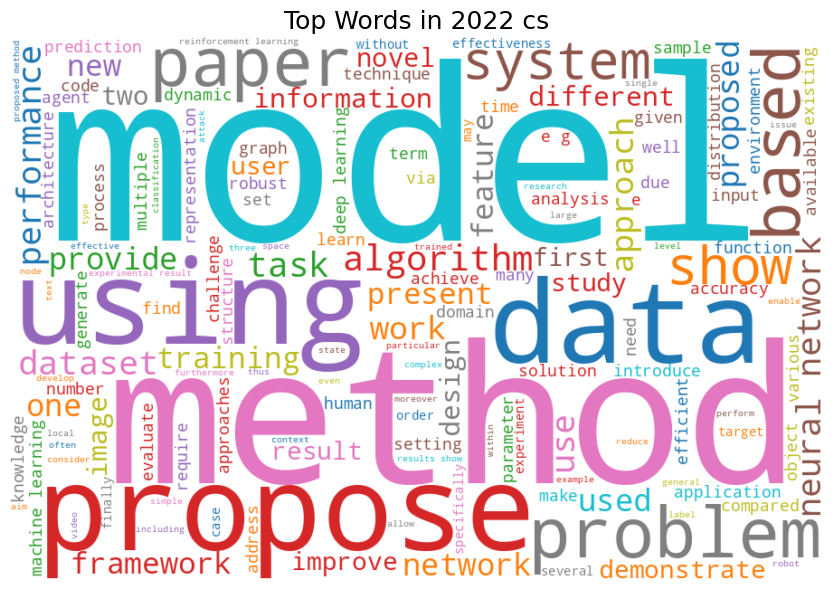

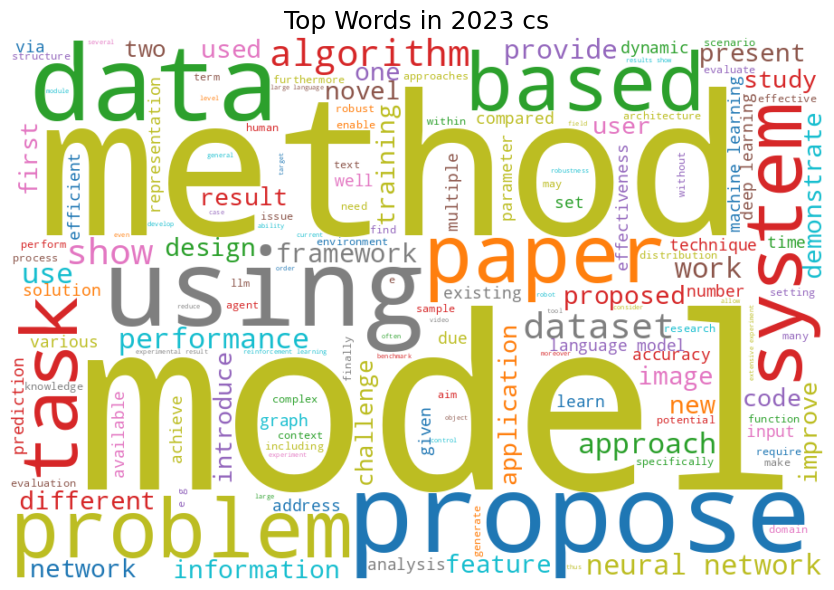

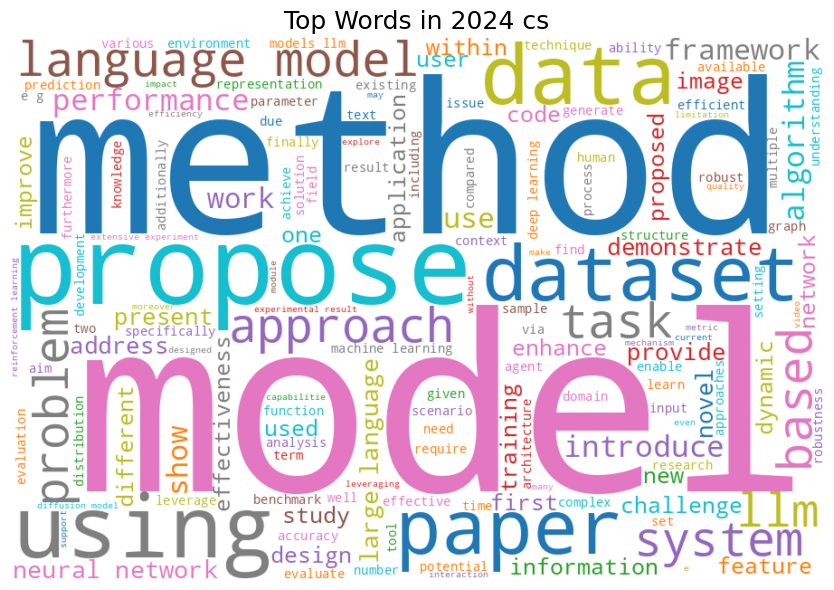

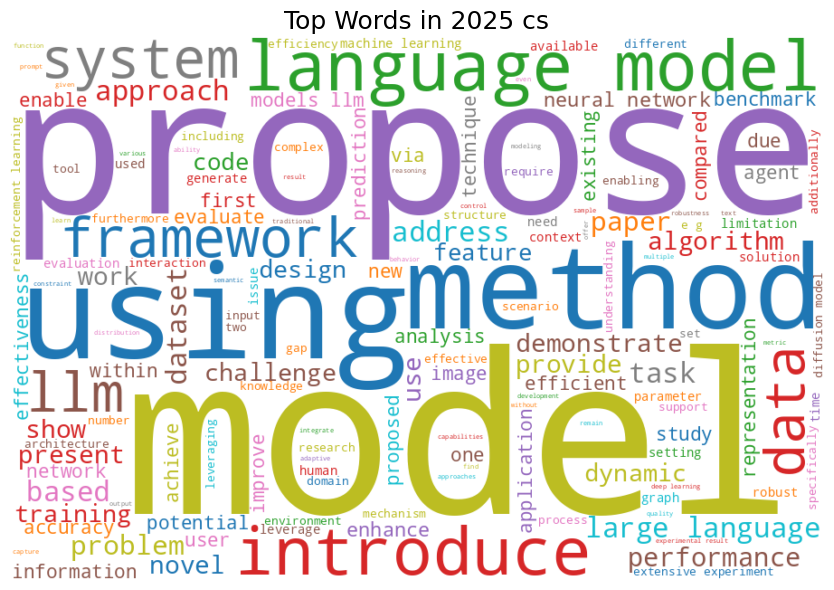

In [7]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

data['submitted_date'] = pd.to_datetime(data['submitted_date'])
data['year'] = data['submitted_date'].dt.year

for year in sorted(data['year'].unique()):
    yearly_texts = " ".join(data.loc[data['year'] == year, 'text'].astype(str))
    
    if not yearly_texts.strip():
        continue

    wc = WordCloud(
        width=900,
        height=600,
        background_color='white',
        colormap='tab10',
        max_words=150
    ).generate(yearly_texts)
    wc.to_file(f"wordcloud/wordcloud_{year}_{SUBJECT}.png")

    plt.figure(figsize=(9,6))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Top Words in {year} {SUBJECT}", fontsize=18)
    plt.tight_layout()
    plt.show()


### Global Word Most Frequncy word

In [8]:
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd

texts = data['text'].dropna().astype(str)

vectorizer = CountVectorizer(stop_words='english', max_features=10000)  
X = vectorizer.fit_transform(texts)

word_freq = X.sum(axis=0).A1
vocab = vectorizer.get_feature_names_out()

freq_df = pd.DataFrame({'word': vocab, 'count': word_freq})
freq_df = freq_df.sort_values(by='count', ascending=False)

print(freq_df.head(50))


             word   count
2283         data  122984
5711        model  112943
5099     learning  109357
5721       models  104361
9608        using   75640
6595  performance   73661
6442        paper   70864
7730      results   64351
5588      methods   62823
5584       method   62287
649      approach   60017
5981      network   59392
953         based   57572
7097      propose   56211
6999      problem   54548
7098     proposed   52556
4596  information   52289
5985     networks   50348
482     algorithm   48186
9234     training   47097
3760    framework   46937
8946      systems   44507
5987       neural   44495
5997          new   43872
2613    different   43030
9137         time   41816
5032     language   40687
9931         work   40020
8990        tasks   39003
4393        image   38867
557      analysis   38585
5039        large   37261
6109        novel   36995
9595         used   36064
2378         deep   36037
8723        study   35468
3332     existing   35042
485    algor

In [9]:
freq_df[freq_df['word'] == "transformer"]

,word,count
9264,transformer,7341


### TF IDF stop words cantidate

In [10]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np

texts = data["text"].tolist()  

vectorizer = TfidfVectorizer(max_features=5000)
X = vectorizer.fit_transform(texts)

terms = np.array(vectorizer.get_feature_names_out())
idf = vectorizer.idf_

tf = np.asarray(X.sum(axis=0)).flatten() / X.shape[0]

tfidf_stats = pd.DataFrame({
    "term": terms,
    "tf": tf,
    "idf": idf
}).sort_values("tf", ascending=False)

stopword_candidates = tfidf_stats.query("tf > 0.01 and idf < 3")
stopword_candidates.head(20)

,term,tf,idf
4540,the,0.136747,1.008330
3108,of,0.087937,1.020357
306,and,0.079099,1.023271
4590,to,0.066293,1.045215
2252,in,0.055887,1.058042
4910,we,0.043552,1.154592
1866,for,0.042864,1.130472
2453,is,0.036305,1.249029
4539,that,0.033552,1.235261
3123,on,0.031688,1.277511


### word frequency but per YEAR

In [11]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer

data['submitted_date'] = pd.to_datetime(data['submitted_date'])
data['year'] = data['submitted_date'].dt.year

vectorizer = TfidfVectorizer(
    stop_words='english', 
    max_features=5000,  
    lowercase=True
)

for year in range(2000, 2026):
    df_year = data[data['year'] == year]
    if df_year.empty:
        continue

    tfidf = vectorizer.fit_transform(df_year['text'])
    scores = tfidf.mean(axis=0).A1  
    words = vectorizer.get_feature_names_out()
    
    top_idx = scores.argsort()[::-1][:10]  
    top_words = [(words[i], scores[i]) for i in top_idx]
    
    print(f"\n=== {year} ===")
    for word, score in top_words:
        print(f"{word:<20} {score:.4f}")



=== 2000 ===
logic                0.0263
model                0.0225
algorithm            0.0201
language             0.0185
problem              0.0179
information          0.0179
paper                0.0176
data                 0.0162
systems              0.0162
using                0.0158

=== 2001 ===
information          0.0183
paper                0.0181
algorithm            0.0170
model                0.0169
data                 0.0167
problem              0.0161
quantum              0.0147
time                 0.0145
language             0.0145
systems              0.0144

=== 2002 ===
problem              0.0208
algorithm            0.0204
logic                0.0197
model                0.0188
data                 0.0183
paper                0.0171
quantum              0.0154
systems              0.0137
information          0.0136
time                 0.0135

=== 2003 ===
data                 0.0237
information          0.0176
problem              0.0174
paper               

In [12]:
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer

data['submitted_date'] = pd.to_datetime(data['submitted_date'])
data['year'] = data['submitted_date'].dt.year

vectorizer = TfidfVectorizer(
    stop_words='english',
    lowercase=True,
    max_features=5000
)

results = []

for year in range(2000, 2026):
    df_year = data[data['year'] == year]
    if df_year.empty:
        continue

    tfidf = vectorizer.fit_transform(df_year['text'])
    words = vectorizer.get_feature_names_out()
    
    tf = np.asarray(tfidf.mean(axis=0)).ravel()
    idf = vectorizer.idf_
    
    temp_df = pd.DataFrame({
        'year': year,
        'word': words,
        'tf': tf,
        'idf': idf
    })
    
    filtered = temp_df[(temp_df['tf'] > 0.01) & (temp_df['idf'] < 3)]
    
    results.append(filtered)

final_df = pd.concat(results, ignore_index=True)



In [13]:
final_df

,year,word,tf,idf
0,2000,algorithm,0.020108,2.430189
1,2000,approach,0.012984,2.749711
2,2000,based,0.014414,2.380178
3,2000,data,0.016224,2.915696
4,2000,different,0.010725,2.943867
...,...,...,...,...
659,2025,tasks,0.014756,2.440713
660,2025,time,0.010264,2.993511
661,2025,training,0.015079,2.527942
662,2025,using,0.014946,2.111656


In [14]:
unique_tf_idf = final_df.drop_duplicates(subset=['word'])
unique_tf_idf

,year,word,tf,idf
0,2000,algorithm,0.020108,2.430189
1,2000,approach,0.012984,2.749711
2,2000,based,0.014414,2.380178
3,2000,data,0.016224,2.915696
4,2000,different,0.010725,2.943867
5,2000,information,0.017883,2.715026
6,2000,language,0.018496,2.597243
7,2000,logic,0.026298,2.726454
8,2000,method,0.013427,2.943867
9,2000,model,0.022515,2.607395
